 # CS6640 Project 1- Ryan Dalby
 General notes:
 - All images used are either provided by this class or are public domain licensed images from Google Images or Flickr.


In [9]:
import numpy as np
import matplotlib.pyplot as plt
import skimage
from skimage import io, segmentation, exposure

root_dir = './project1_images/'


 ## Converting color images to grayscale

 First I converted and loaded all images that will be used for project 1.
 Then I converted all color images to grayscale using my custom color to grayscale converter and saved the grayscale images.
 Each grayscale image and corresponding color image is shown (if there is a corresponding color image) below.

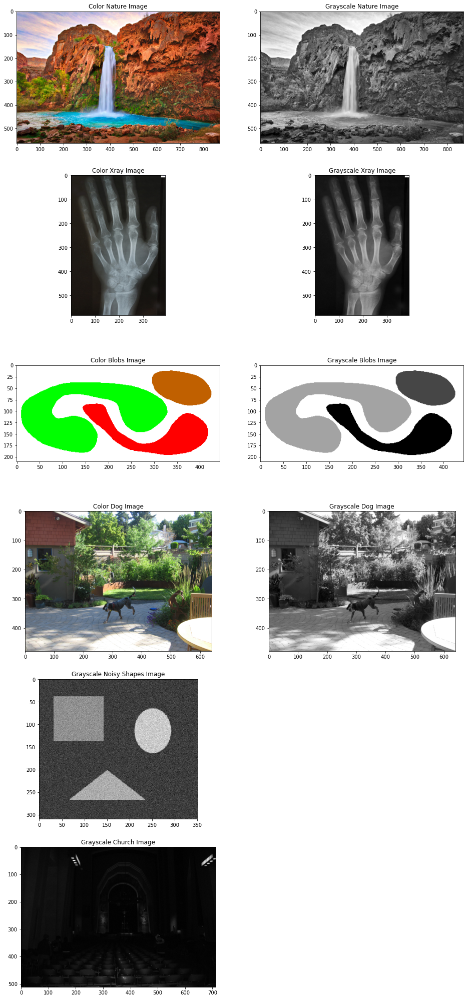

In [10]:
# Convert a color image to grayscale using the same weight values as those used in rgb2gray() in skimage
def color_to_gray(img):
    weights = np.array([0.2125, 0.7154, 0.0721])
    if (len(img.shape) < 3 or img.shape[2] < 3):
        print('Image is not a color image that can be converted to gray')
        return img
    return np.round(np.dot(img[...,:3], weights)).astype(np.uint8)

subplot_rows = 6
subplot_cols = 2
images_fig = plt.figure(figsize=(subplot_cols*8,subplot_rows*6))

color_nature_img = io.imread(root_dir + 'nature.png')
images_fig.add_subplot(subplot_rows, subplot_cols, 1)
plt.imshow(color_nature_img)
plt.title('Color Nature Image')
nature_img = color_to_gray(color_nature_img)
io.imsave(root_dir + 'nature_gray.png', nature_img.astype(np.uint8))
images_fig.add_subplot(subplot_rows, subplot_cols, 2)
plt.imshow(nature_img, cmap='gray')
plt.title('Grayscale Nature Image')

color_xray_img = io.imread(root_dir + 'xray.png')
images_fig.add_subplot(subplot_rows, subplot_cols, 3)
plt.imshow(color_xray_img)
plt.title('Color Xray Image')
xray_img = color_to_gray(color_xray_img)
io.imsave(root_dir + 'xray_gray.png', xray_img.astype(np.uint8))
images_fig.add_subplot(subplot_rows, subplot_cols, 4)
plt.imshow(xray_img, cmap='gray')
plt.title('Grayscale Xray Image')

color_blobs_img = io.imread(root_dir + 'blobs.gif')
images_fig.add_subplot(subplot_rows, subplot_cols, 5)
plt.imshow(color_blobs_img)
plt.title('Color Blobs Image')
blobs_img = color_to_gray(color_blobs_img)
io.imsave(root_dir + 'blobs_gray.png', blobs_img.astype(np.uint8))
images_fig.add_subplot(subplot_rows, subplot_cols, 6)
plt.imshow(blobs_img, cmap='gray')
plt.title('Grayscale Blobs Image')

color_dog_img = io.imread(root_dir + 'houndog1.png')
images_fig.add_subplot(subplot_rows, subplot_cols, 7)
plt.imshow(color_dog_img)
plt.title('Color Dog Image')
dog_img = color_to_gray(color_dog_img)
io.imsave(root_dir + 'houndog1_gray.png', dog_img.astype(np.uint8))
images_fig.add_subplot(subplot_rows, subplot_cols, 8)
plt.imshow(dog_img, cmap='gray')
plt.title('Grayscale Dog Image')

noise_shapes_img = io.imread(root_dir + 'shapes_noise.tif')
images_fig.add_subplot(subplot_rows, subplot_cols, 9)
plt.imshow(noise_shapes_img, cmap='gray')
plt.title('Grayscale Noisy Shapes Image')

church_img = io.imread(root_dir + 'church.tif')
images_fig.add_subplot(subplot_rows, subplot_cols, 11)
plt.imshow(church_img, cmap='gray')
plt.title('Grayscale Church Image')

plt.show()


 ## Building a histogram
 Next I implemented a function to generate a histogram from a grayscale image with a given number of bins.
 I then plotted the original image, a histogram with a lower count of bins, and a histogram with a higher count of bins to observe the effect of bin count on the histogram.
 Analyzing the histograms of some of the images:
 - X-ray image histogram: This histogram shows a peak around 25 that is likely the black background. Then there are two smaller peaks around 100 and 150 that could be the tissue then the bones respectively. For this image having 100 bins actually causes some bias in the bins (due to some of the floating point bins rarely being chosen since we are sampling from integer values), thus 50 bins appears to be better since this sampling bias doesn't occur but the histogram still retains most information.

 - Blobs image histogram: This histogram shows very clear peaks near 55, 110, 180, and 255. The peak at 255 is likely the white background and the rest are the other blobs. For this one I experimented with having only 3 bins which causes information loss we actually can't identify one of blobs.

 - Dog image histogram: This histogram shows a clear peak at 255 which is likely the over exposed parts of the image. There are also two peaks near 60 (the dog) and 120 (the house and plants) but like the xray image they aren't very obvious peaks since the histogram in this image is distributed across the bins. Like for the x-ray image, with too high of bins we get sampling bias in the histogram, 50 bins appears to work well for this image.

 In the end, I noticed that higher bin count results in a closer approximation a continuous histogram and shows more detail about the image, but with too high of a bin count there becomes bias in the sampling process because of how some bins never get chosen because we are sampling integers. Also note this discrete sampling process can actually separate parts of the image for you before any other processing which may be desirable in some cases (i.e. the blobs).

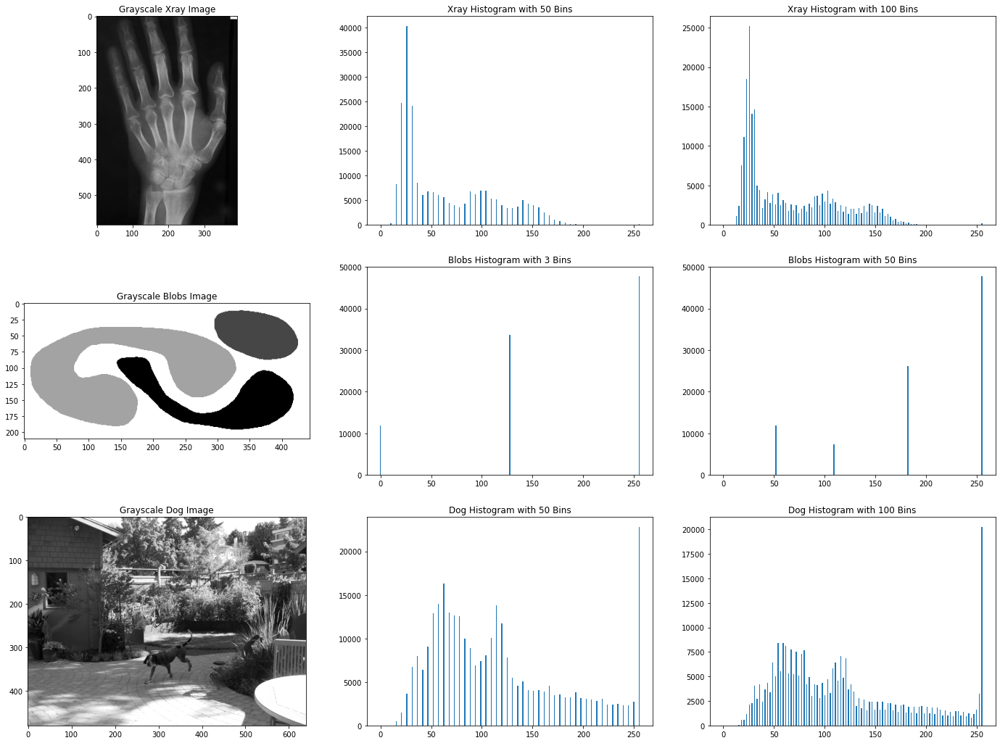

In [11]:
# Given a grayscale image will return a 2D array representing a histogram (first column is bin values and second column is bin counts)
# Can set the number of bins the histogram will have, will determine even spacing between each bin value 
# Can also set what the max value of the histogram should be, default is 0 to 255 
def grayimg_to_histogram(gray_img, bins = 50, max_val = 255):
    bin_vals = np.linspace(0.0, max_val, num=bins)
    bin_counts = np.zeros_like(bin_vals)
    for row in gray_img:
        for pixel_value in row:
            bin_idx = np.abs(bin_vals - pixel_value).argmin()
            bin_counts[bin_idx] += 1  
    hist = np.column_stack([bin_vals, bin_counts]) 
    return hist

subplot_rows = 3
subplot_cols = 3
hist_fig = plt.figure(figsize=(subplot_cols*8,subplot_rows*6))

hist_fig.add_subplot(subplot_rows, subplot_cols, 1)
plt.imshow(xray_img, cmap='gray')
plt.title('Grayscale Xray Image')
xray_hist = grayimg_to_histogram(xray_img, bins=50)
hist_fig.add_subplot(subplot_rows, subplot_cols, 2)
plt.bar(xray_hist[:,0], xray_hist[:,1], width=1)
plt.title('Xray Histogram with 50 Bins')
xray_hist = grayimg_to_histogram(xray_img, bins=100)
hist_fig.add_subplot(subplot_rows, subplot_cols, 3)
plt.bar(xray_hist[:,0], xray_hist[:,1], width=1)
plt.title('Xray Histogram with 100 Bins')

hist_fig.add_subplot(subplot_rows, subplot_cols, 4)
plt.imshow(blobs_img, cmap='gray')
plt.title('Grayscale Blobs Image')
blob_hist = grayimg_to_histogram(blobs_img, bins=3)
hist_fig.add_subplot(subplot_rows, subplot_cols, 5)
plt.bar(blob_hist[:,0], blob_hist[:,1], width=1)
plt.title('Blobs Histogram with 3 Bins')
blob_hist = grayimg_to_histogram(blobs_img, bins=50)
hist_fig.add_subplot(subplot_rows, subplot_cols, 6)
plt.bar(blob_hist[:,0], blob_hist[:,1], width=1)
plt.title('Blobs Histogram with 50 Bins')

hist_fig.add_subplot(subplot_rows, subplot_cols, 7)
plt.imshow(dog_img, cmap='gray')
plt.title('Grayscale Dog Image')
dog_hist = grayimg_to_histogram(dog_img, bins=50)
hist_fig.add_subplot(subplot_rows, subplot_cols, 8)
plt.bar(dog_hist[:,0], dog_hist[:,1], width=1)
plt.title('Dog Histogram with 50 Bins')
dog_hist = grayimg_to_histogram(dog_img, bins=100)
hist_fig.add_subplot(subplot_rows, subplot_cols, 9)
plt.bar(dog_hist[:,0], dog_hist[:,1], width=1)
plt.title('Dog Histogram with 100 Bins')

plt.show()


 ## Double-sided thresholding
 Next I impelmented double-sided thresholding. I applied thresholding to the images I analyzed histograms for.

 - X-ray image threshold: I chose a threshold between 123 and 255 since this best removed the black background and most of the tissue while still mostly leaving the bones (it represents the final peak of the histogram near 150).

 - Blobs image threshold: I chose a threshold between 0 and 200 for this image because all I needed was to remove the background which is at 255.

 - Dog image threshold: I chose a threshold between 0 and 70 to remove most of the highlights which consist of the ground and the sky, this isolates the dog and parts of the house. This represents the first two peaks of the histogram.

 In the end, I used this thresholding to effectively remove the background and unimportant details from the images.

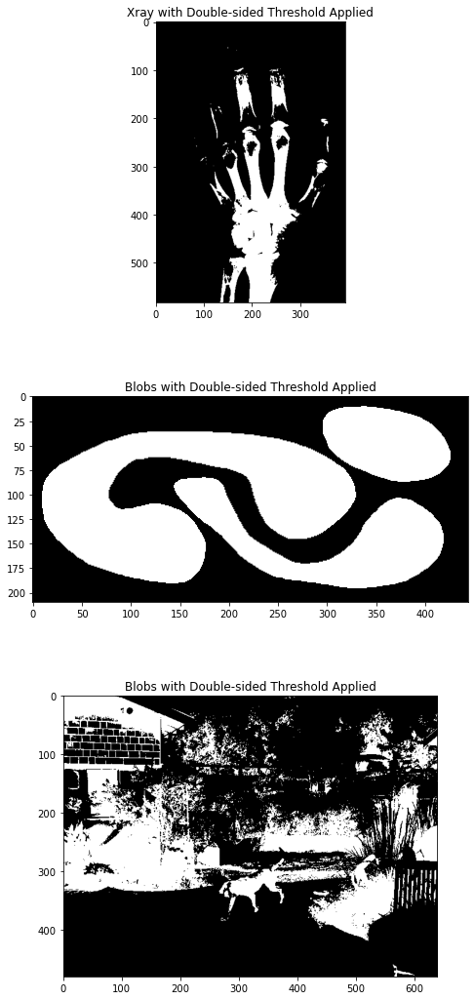

In [12]:
# Performs double-sided thresholding on a grayscale image given lower and upper thresholds. 
# Will return a boolean image with 1 meaning threshold was met for a pixel and 0 meaning the threshold was not met.
def double_sided_thresholding(gray_img, lower_thresh, upper_thresh):
    threshold_image = np.zeros_like(gray_img)
    for i in range(gray_img.shape[0]):
        for j in range(len(gray_img[i, :])):
            pixel_value = gray_img[i, j]
            if (pixel_value > lower_thresh and pixel_value < upper_thresh):
                threshold_image[i,j] = 1
            else:
                threshold_image[i,j] = 0
    return threshold_image

subplot_rows = 3
subplot_cols = 1
thresh_fig = plt.figure(figsize=(subplot_cols*8,subplot_rows*6))

threshhold_xray_img = double_sided_thresholding(xray_img, 123, 255)
thresh_fig.add_subplot(subplot_rows, subplot_cols, 1)
plt.imshow(threshhold_xray_img, cmap='gray')
plt.title('Xray with Double-sided Threshold Applied')

threshold_blobs_img = double_sided_thresholding(blobs_img, 0, 200)
thresh_fig.add_subplot(subplot_rows, subplot_cols, 2)
plt.imshow(threshold_blobs_img, cmap='gray')
plt.title('Blobs with Double-sided Threshold Applied')

threshold_dog_img = double_sided_thresholding(dog_img, 0, 70)
thresh_fig.add_subplot(subplot_rows, subplot_cols, 3)
plt.imshow(threshold_dog_img, cmap='gray')
plt.title('Blobs with Double-sided Threshold Applied')

plt.show()


 ## Connected Component Analysis
 Next I implemented a function which applies connected component analysis to the non-removed parts of a threshold image using skimage's flood_fill function then using custom logic to label the identified region and generate an image with random colors for each label. I then performed connected component analysis to the same images I applied a threshold to.
 The function I created also outputs information about the connected component size and the color that was used to fill the connected component, this could be further used to analyze the identified components in the image.

 - X-ray image connected component: Looking at connected components greater than 10 pixels we get some components that don't define bones, increasing this limit to 100 pixels we get reasonable identification of bones given the non-enhanced image.

 - Blobs image connected component: This connected component analysis was straight forward. We see at 100 pixels all the blobs are identified. Increasing the limit to 10000 pixels we get the smallest componenet excluded.

 - Dog image threshold component: Looking at the connected components greater than 100 pixels picks up on small shapes like the plants on the far right of the image. Looking at greater than 1000 pixels removes one of the limbs of the dog and some of the plant information so this may or may not be desirable depending on what the goal is. Another thing to not is the house is a very large connected component and with more thresholding or other processing it may be possible to identify other componenets in it.

 In the end, I managed to identify some objects in the x-ray, blobs, and dog images using connected component analysis. With more processing before applying connected component I believe I could better find bones in the x-ray image and the dog in the dog image.

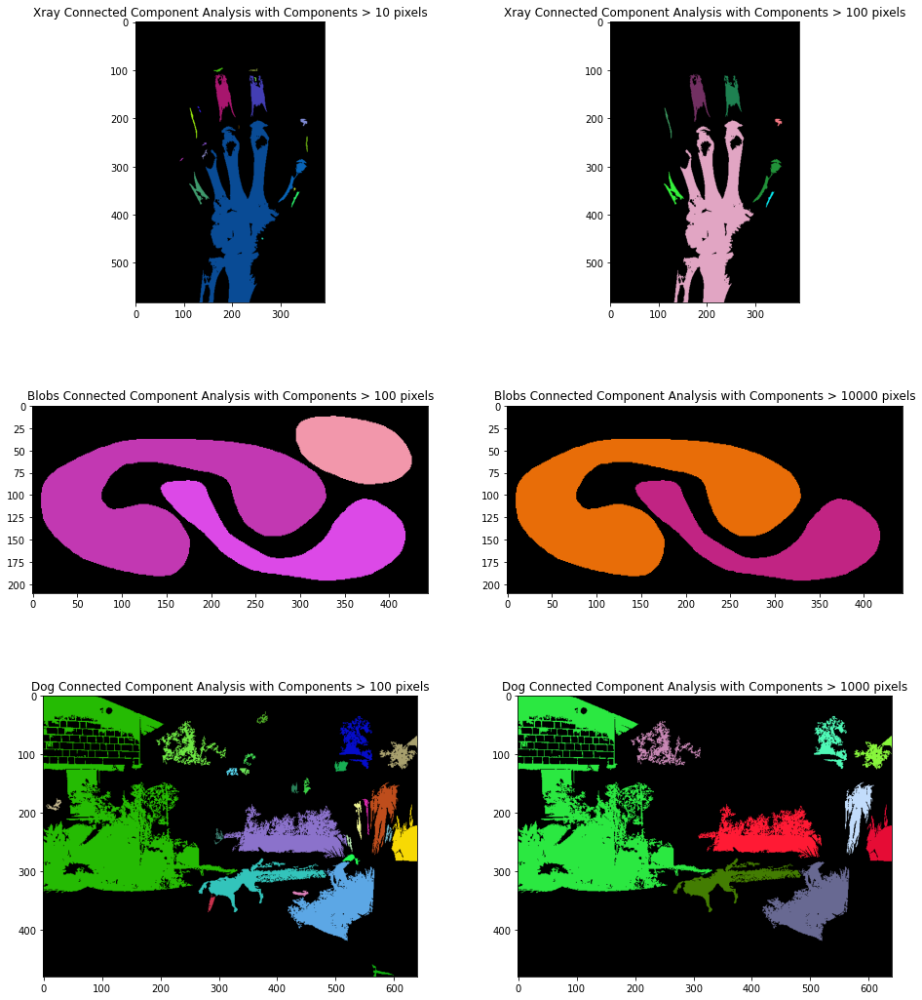

In [13]:
# Given a threshold image (consiting of 1's for should be tested for connectivity and 0's for shouldn't be tested for connectivity)
# will use skimage's implementation of the flood fill algorithm to identify connected components and assign a class to each disctinct component bigger than the given pixel size limit.
# Will return a tuple consisting of (labelled image, colored labelled image, a dictionary mapping from label to a tuple of (connected component size, random color value that represents label in color labelled image)) 
def connected_component_analysis(threshold_img, px_size_limit = 100):
    cc_label_img = np.copy(threshold_img)
    cc_label_dict = {}
    fill_val = 2
    for i in range(cc_label_img.shape[0]):
        for j in range(len(cc_label_img[i, :])):
            pixel_value = cc_label_img[i, j]
            # Will only test for connectivity if pixel value is 1
            if pixel_value == 1:
                ff_img = segmentation.flood_fill(cc_label_img, (i, j), fill_val)
                bool_ff_img = ff_img == fill_val 
                px_fill_size = np.count_nonzero(bool_ff_img)
                if(px_fill_size > px_size_limit):
                    cc_label_img[bool_ff_img] = fill_val
                    random_color = np.random.randint([0,0,0],[256,256,256], dtype=np.uint8) 
                    cc_label_dict[fill_val] = (px_fill_size, random_color)
                    fill_val += 1
                else:
                    cc_label_img[bool_ff_img] = 0
            else:
                continue
    
    cc_display_img = np.zeros((cc_label_img.shape[0], cc_label_img.shape[1], 3), dtype=np.uint8)
    for label in cc_label_dict:
        _, random_color = cc_label_dict[label]
        cc_display_img[cc_label_img==label] = random_color
    return (cc_label_img, cc_display_img, cc_label_dict)

subplot_rows = 3
subplot_cols = 2
cc_fig = plt.figure(figsize=(subplot_cols*8,subplot_rows*6))

cc_xray = connected_component_analysis(threshhold_xray_img, px_size_limit=10)
cc_fig.add_subplot(subplot_rows, subplot_cols, 1)
plt.imshow(cc_xray[1], cmap='gray')
plt.title('Xray Connected Component Analysis with Components > 10 pixels')
cc_xray = connected_component_analysis(threshhold_xray_img, px_size_limit=100)
cc_fig.add_subplot(subplot_rows, subplot_cols, 2)
plt.imshow(cc_xray[1], cmap='gray')
plt.title('Xray Connected Component Analysis with Components > 100 pixels')
# print('Xray connected componenet labels {label: (cc size in pixels, color value)} as follows: ')
# print(cc_xray_img[2])

cc_blobs = connected_component_analysis(threshold_blobs_img, px_size_limit=100)
cc_fig.add_subplot(subplot_rows, subplot_cols, 3)
plt.imshow(cc_blobs[1], cmap='gray')
plt.title('Blobs Connected Component Analysis with Components > 100 pixels')
cc_blobs = connected_component_analysis(threshold_blobs_img, px_size_limit=10000)
cc_fig.add_subplot(subplot_rows, subplot_cols, 4)
plt.imshow(cc_blobs[1], cmap='gray')
plt.title('Blobs Connected Component Analysis with Components > 10000 pixels')
# print('Blobs connected componenet labels {label: (cc size in pixels, color value)} as follows: ')
# print(cc_blobs_img[2])

cc_dog = connected_component_analysis(threshold_dog_img, px_size_limit=100)
cc_fig.add_subplot(subplot_rows, subplot_cols, 5)
plt.imshow(cc_dog[1], cmap='gray')
plt.title('Dog Connected Component Analysis with Components > 100 pixels')
cc_dog = connected_component_analysis(threshold_dog_img, px_size_limit=1000)
cc_fig.add_subplot(subplot_rows, subplot_cols, 6)
plt.imshow(cc_dog[1], cmap='gray')
plt.title('Dog Connected Component Analysis with Components > 1000 pixels')
# print('Dog connected componenet labels {label: (cc size in pixels, color value)} as follows: ')
# print(cc_dog_img[2])

plt.show()


 ## Histogram Equalization
 For histogram equalization I used skimage's built in implementation of histogram equalization. This impelmentation outputs a float version of the image so I converted the initial images to float so I could get a comparison before and after histogram equalization.
 I applied this equalization to the following images:
 - Nature image histogram equalization: Applying standard histogram equalization to the nature image resulted in relatively even redistribution the histogram to being close to a uniform distribution. In the image it pulls the lower intensity grayscale values higher and means the dark parts of the image appear brighter.
 - Noisy shapes image histogram equalization: Applying histogram equalization results in a uniform histogram although it results in increased noise from the dark parts of the image, which is evidently clear with the already noisy shapes image.
 - Church image histogram equalization: Histogram equalization results in a much brighter image for the very dark church image. This does result in more noise but the image becomes visible. It is also interesting to note that with the limited histogram information we started with we can only get so much out of it when equalized so the bins get spread out further.

 Overall, applying overall histogram equalization is especially effective for images which have a very concentrated histogram as it pulls out a lot of detail. It can amplify noise and can make certain parts of the image look unnatural because it uses global information for transforming all pixels.

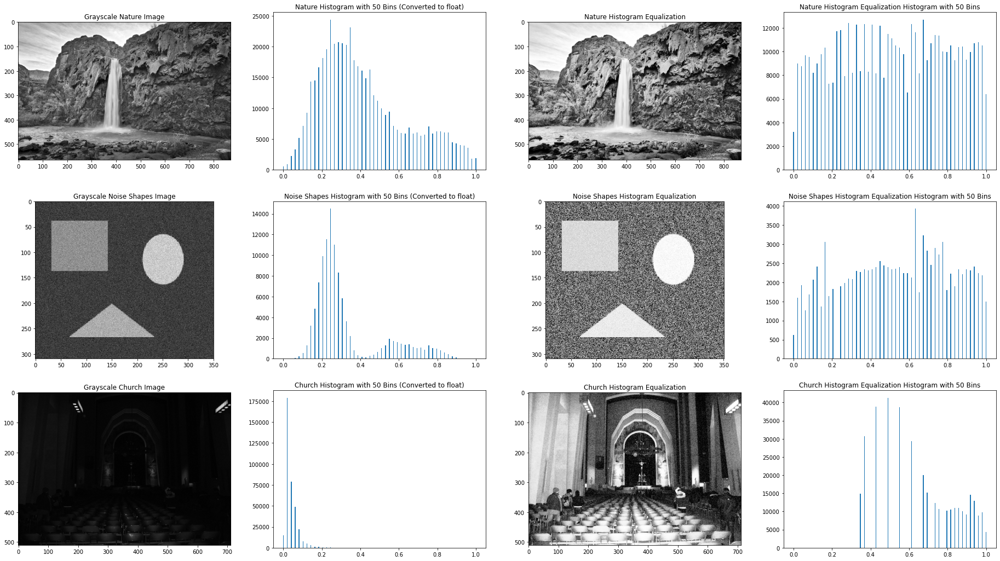

In [14]:
subplot_rows = 3
subplot_cols = 4
hist2_fig = plt.figure(figsize=(subplot_cols*8,subplot_rows*6))

hist2_fig.add_subplot(subplot_rows, subplot_cols, 1)
nature_float_img = skimage.img_as_float(nature_img)
plt.imshow(nature_float_img, cmap='gray')
plt.title('Grayscale Nature Image')
nature_hist = grayimg_to_histogram(nature_float_img, max_val=1.0)
hist2_fig.add_subplot(subplot_rows, subplot_cols, 2)
plt.bar(nature_hist[:,0], nature_hist[:,1], width=1/255)
plt.title('Nature Histogram with 50 Bins (Converted to float)')
# Histogram Equalization
nature_histeq_img = exposure.equalize_hist(nature_float_img, nbins=50)
hist2_fig.add_subplot(subplot_rows, subplot_cols, 3)
plt.imshow(nature_histeq_img, cmap='gray')
plt.title('Nature Histogram Equalization')
nature_histeq_hist = grayimg_to_histogram(nature_histeq_img, max_val=1.0)
hist2_fig.add_subplot(subplot_rows, subplot_cols, 4)
plt.bar(nature_histeq_hist[:,0], nature_histeq_hist[:,1], width=1/255)
plt.title('Nature Histogram Equalization Histogram with 50 Bins')

hist2_fig.add_subplot(subplot_rows, subplot_cols, 5)
noise_shapes_float_img = skimage.img_as_float(noise_shapes_img)
plt.imshow(noise_shapes_float_img, cmap='gray')
plt.title('Grayscale Noise Shapes Image')
noise_shapes_hist = grayimg_to_histogram(noise_shapes_float_img, max_val=1.0)
hist2_fig.add_subplot(subplot_rows, subplot_cols, 6)
plt.bar(noise_shapes_hist[:,0], noise_shapes_hist[:,1], width=1/255)
plt.title('Noise Shapes Histogram with 50 Bins (Converted to float)')
# Histogram Equalization
noise_shapes_histeq_img = exposure.equalize_hist(noise_shapes_float_img, nbins=50)
hist2_fig.add_subplot(subplot_rows, subplot_cols, 7)
plt.imshow(noise_shapes_histeq_img, cmap='gray')
plt.title('Noise Shapes Histogram Equalization')
noise_shapes_histeq_hist = grayimg_to_histogram(noise_shapes_histeq_img, max_val=1.0)
hist2_fig.add_subplot(subplot_rows, subplot_cols, 8)
plt.bar(noise_shapes_histeq_hist[:,0], noise_shapes_histeq_hist[:,1], width=1/255)
plt.title('Noise Shapes Histogram Equalization Histogram with 50 Bins')

hist2_fig.add_subplot(subplot_rows, subplot_cols, 9)
church_float_img = skimage.img_as_float(church_img)
plt.imshow(church_float_img, cmap='gray')
plt.title('Grayscale Church Image')
church_hist = grayimg_to_histogram(church_float_img, max_val=1.0)
hist2_fig.add_subplot(subplot_rows, subplot_cols, 10)
plt.bar(church_hist[:,0], church_hist[:,1], width=1/255)
plt.title('Church Histogram with 50 Bins (Converted to float)')
# Histogram Equalization
church_histeq_img = exposure.equalize_hist(church_float_img, nbins=50)
hist2_fig.add_subplot(subplot_rows, subplot_cols, 11)
plt.imshow(church_histeq_img, cmap='gray')
plt.title('Church Histogram Equalization')
church_histeq_hist = grayimg_to_histogram(church_histeq_img, max_val=1.0)
hist2_fig.add_subplot(subplot_rows, subplot_cols, 12)
plt.bar(church_histeq_hist[:,0], church_histeq_hist[:,1], width=1/255)
plt.title('Church Histogram Equalization Histogram with 50 Bins')

plt.show()


 ## Adaptive Histogram Equalization
 For adapative histogram equalization I used skimage's built in implementation of contrast limited adaptive equalization (CLAHE). This type of adaptive equalization takes in the following parameters:
 - Kernel size- is the size of the window over which a local histogram is built for.
 - Clip limit- limits the maximum change in cumulative distribution function (CDF) by clipping the histogram at the described value and redistributing under the histogram.
 - Bin size- is the number of bins which the local histogram is built using.

 I applied this adaptive equalization to the following images to analyze the effect of these 3 paramters:

 - Kernel size variation with nature image: In the nature image I first tried adaptive histogram equalization using a kernel size of 10 by 10 pixels. This resulted in a histogram which was closer to a uniform histogram but still very closely resembled the original histogram. With a larger kernel size of 100 pixels by 100 pixels the histogram appears much closer to a uniform histogram. The images are enhanced in both cases, showing more details in the dark, but the larger kernel size results in more details but more noise as well.
 - Clip limit variation with noisy shapes image: In the noisy shapes image I changed the clip limit of the histogram. With the default clip limit of 0.01 the histogram appears to be equalized a bit but the image does not have too much contrast. With the higher clipping value of 0.4 the noise becomes much worse in the image but there is a more uniform histogram and an image with more contrast.
 - Bin size vartion with church image: In the church image which is very dark I changed the bin counts the local histogram is built from. With only 25 sampling bins little to no equalization resulted in the image, this is especially obvious with the dark image that looks largely the same. With 256 bins there is some equalization that occurs but it is still small for this image when compared to standard histogram equalization which would be able to use all the global information to equalize the histogram.

 Overall, adaptive histogram equalization is similar to standard histogram equalization (with a large kernel it is the same) but it gives more parameters to tune to get a desired image processing result. Kernel size determines how much local information in used and be used to give good local contrast. For clip limit it can control how strong equalization is by limiting the slope of the CDF used to do histogram equalization. Lastly, bin size can limit the local information that can be extracted from a given window and can reduce the equalization with a smaller bin count.

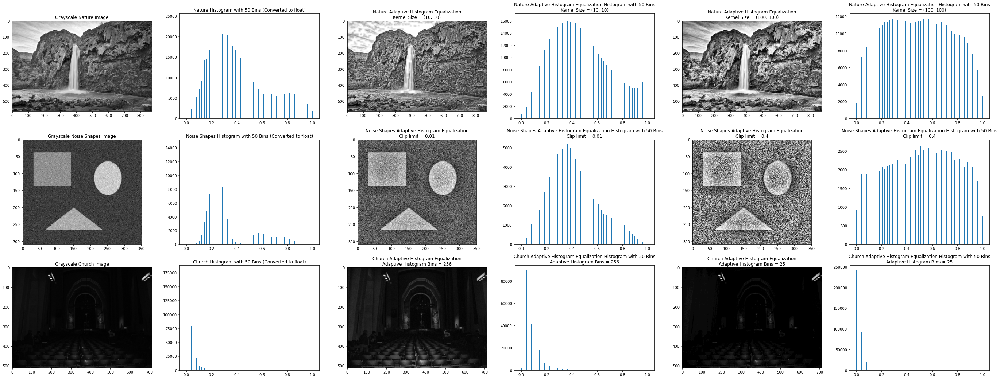

In [15]:
subplot_rows = 3
subplot_cols = 6
adaphist_fig = plt.figure(figsize=(subplot_cols*8,subplot_rows*6))

adaphist_fig.add_subplot(subplot_rows, subplot_cols, 1)
plt.imshow(nature_float_img, cmap='gray')
plt.title('Grayscale Nature Image')
nature_hist = grayimg_to_histogram(nature_float_img, max_val=1.0)
adaphist_fig.add_subplot(subplot_rows, subplot_cols, 2)
plt.bar(nature_hist[:,0], nature_hist[:,1], width=1/255)
plt.title('Nature Histogram with 50 Bins (Converted to float)')
# Adaptive Histogram Equalization Small Kernel Size 
nature_adaphisteq_img = exposure.equalize_adapthist(nature_float_img, kernel_size=(10, 10))
adaphist_fig.add_subplot(subplot_rows, subplot_cols, 3)
plt.imshow(nature_adaphisteq_img, cmap='gray')
plt.title('Nature Adaptive Histogram Equalization\nKernel Size = (10, 10)')
nature_adaphisteq_hist = grayimg_to_histogram(nature_adaphisteq_img, max_val=1.0)
adaphist_fig.add_subplot(subplot_rows, subplot_cols, 4)
plt.bar(nature_adaphisteq_hist[:,0], nature_adaphisteq_hist[:,1], width=1/255)
plt.title('Nature Adaptive Histogram Equalization Histogram with 50 Bins\nKernel Size = (10, 10)')
# Adaptive Histogram Equalization Large Kernel Size 
nature_adaphisteq_img = exposure.equalize_adapthist(nature_float_img, kernel_size=(100, 100))
adaphist_fig.add_subplot(subplot_rows, subplot_cols, 5)
plt.imshow(nature_adaphisteq_img, cmap='gray')
plt.title('Nature Adaptive Histogram Equalization\nKernel Size = (100, 100)')
nature_adaphisteq_hist = grayimg_to_histogram(nature_adaphisteq_img, max_val=1.0)
adaphist_fig.add_subplot(subplot_rows, subplot_cols, 6)
plt.bar(nature_adaphisteq_hist[:,0], nature_adaphisteq_hist[:,1], width=1/255)
plt.title('Nature Adaptive Histogram Equalization Histogram with 50 Bins\nKernel Size = (100, 100)')

adaphist_fig.add_subplot(subplot_rows, subplot_cols, 7)
plt.imshow(noise_shapes_float_img, cmap='gray')
plt.title('Grayscale Noise Shapes Image')
noise_shapes_hist = grayimg_to_histogram(noise_shapes_float_img, max_val=1.0)
adaphist_fig.add_subplot(subplot_rows, subplot_cols, 8)
plt.bar(noise_shapes_hist[:,0], noise_shapes_hist[:,1], width=1/255)
plt.title('Noise Shapes Histogram with 50 Bins (Converted to float)')
# Adaptive Histogram Equalization Small Clip Limit 
noise_shapes_adaphisteq_img = exposure.equalize_adapthist(noise_shapes_float_img, clip_limit=0.01)
adaphist_fig.add_subplot(subplot_rows, subplot_cols, 9)
plt.imshow(noise_shapes_adaphisteq_img, cmap='gray')
plt.title('Noise Shapes Adaptive Histogram Equalization\nClip limit = 0.01')
noise_shapes_adaphisteq_hist = grayimg_to_histogram(noise_shapes_adaphisteq_img, max_val=1.0)
adaphist_fig.add_subplot(subplot_rows, subplot_cols, 10)
plt.bar(noise_shapes_adaphisteq_hist[:,0], noise_shapes_adaphisteq_hist[:,1], width=1/255)
plt.title('Noise Shapes Adaptive Histogram Equalization Histogram with 50 Bins\nClip limit = 0.01')
# Adaptive Histogram Equalization Large Clip Limit 
noise_shapes_adaphisteq_img = exposure.equalize_adapthist(noise_shapes_float_img, clip_limit=0.4)
adaphist_fig.add_subplot(subplot_rows, subplot_cols, 11)
plt.imshow(noise_shapes_adaphisteq_img, cmap='gray')
plt.title('Noise Shapes Adaptive Histogram Equalization\nClip limit = 0.4')
noise_shapes_adaphisteq_hist = grayimg_to_histogram(noise_shapes_adaphisteq_img, max_val=1.0)
adaphist_fig.add_subplot(subplot_rows, subplot_cols, 12)
plt.bar(noise_shapes_adaphisteq_hist[:,0], noise_shapes_adaphisteq_hist[:,1], width=1/255)
plt.title('Noise Shapes Adaptive Histogram Equalization Histogram with 50 Bins\nClip limit = 0.4')

adaphist_fig.add_subplot(subplot_rows, subplot_cols, 13)
plt.imshow(church_float_img, cmap='gray')
plt.title('Grayscale Church Image')
church_hist = grayimg_to_histogram(church_float_img, max_val=1.0)
adaphist_fig.add_subplot(subplot_rows, subplot_cols, 14)
plt.bar(church_hist[:,0], church_hist[:,1], width=1/255)
plt.title('Church Histogram with 50 Bins (Converted to float)')
# Adaptive Histogram Equalization Large Number of Bins 
church_adaphisteq_img = exposure.equalize_adapthist(church_float_img, nbins=256)
adaphist_fig.add_subplot(subplot_rows, subplot_cols, 15)
plt.imshow(church_adaphisteq_img, cmap='gray')
plt.title('Church Adaptive Histogram Equalization\nAdaptive Histogram Bins = 256')
church_adaphisteq_hist = grayimg_to_histogram(church_adaphisteq_img, max_val=1.0)
adaphist_fig.add_subplot(subplot_rows, subplot_cols, 16)
plt.bar(church_adaphisteq_hist[:,0], church_adaphisteq_hist[:,1], width=1/255)
plt.title('Church Adaptive Histogram Equalization Histogram with 50 Bins\nAdaptive Histogram Bins = 256')
# Adaptive Histogram Equalization Small Number of Bins 
church_adaphisteq_img = exposure.equalize_adapthist(church_float_img, nbins=25)
adaphist_fig.add_subplot(subplot_rows, subplot_cols, 17)
plt.imshow(church_adaphisteq_img, cmap='gray')
plt.title('Church Adaptive Histogram Equalization\nAdaptive Histogram Bins = 25')
church_adaphisteq_hist = grayimg_to_histogram(church_adaphisteq_img, max_val=1.0)
adaphist_fig.add_subplot(subplot_rows, subplot_cols, 18)
plt.bar(church_adaphisteq_hist[:,0], church_adaphisteq_hist[:,1], width=1/255)
plt.title('Church Adaptive Histogram Equalization Histogram with 50 Bins\nAdaptive Histogram Bins = 25')

plt.show()


